In [32]:
import os
import pandas as pd
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import euclidean
import folium
import plotly.graph_objects as go

### Definition of Functions

In [2]:

# Function to read all CSV files in a folder
def read_csv_files(folder_path):
    all_files = glob(os.path.join(folder_path, "*.csv"))
    data_frames = []
    for file in all_files:
        df = pd.read_csv(file)
        data_frames.append(df)
    return data_frames

# Function to extract coordinates (lat, long, alt)
def extract_coordinates(data_frames):
    coordinates = []
    for df in data_frames:
        # Assuming the CSV has columns named 'lat', 'long', 'alt'
        coords = df[['Latitude', 'Longitude', 'Altitude']].values
        coordinates.append(coords)
    return coordinates

# Function to read ground truth path
def read_ground_truth(file_path):
    df = pd.read_csv(file_path)
    ground_truth = df[['Latitude', 'Longitude', 'Altitude']].values
    return ground_truth


In [ ]:
# Function to compute deviations for latitude, longitude, and altitude
def compute_deviations(flight_paths, ground_truth):
    lat_deviations = []
    long_deviations = []
    alt_deviations = []
    for path in flight_paths:
        lat_path_deviations = []
        long_path_deviations = []
        alt_path_deviations = []
        for i in range(min(len(path), len(ground_truth))):
            lat_deviation = abs(path[i][0] - ground_truth[i][0])
            long_deviation = abs(path[i][1] - ground_truth[i][1])
            alt_deviation = abs(path[i][2] - ground_truth[i][2])
            lat_path_deviations.append(lat_deviation)
            long_path_deviations.append(long_deviation)
            alt_path_deviations.append(alt_deviation)
        lat_deviations.append(lat_path_deviations)
        long_deviations.append(long_path_deviations)
        alt_deviations.append(alt_path_deviations)
    return lat_deviations, long_deviations, alt_deviations


### BUOCHS with AR

In [66]:

# Folder containing the CSV files
folder_path = './BUOCHS_AR/'
ground_truth_path = '01_Buochs_AR_2024-06-18-12-59.csv' #./USERSTUDY/TASKS_StartingPoints/XXX.csv

# Read the CSV files
data_frames = read_csv_files(folder_path)

# Extract the coordinates from the files
flight_paths = extract_coordinates(data_frames)

# Read the ground truth path
ground_truth = read_ground_truth(ground_truth_path)



FileNotFoundError: [Errno 2] No such file or directory: '01_Buochs_AR_2024-06-18-12-59.csv'

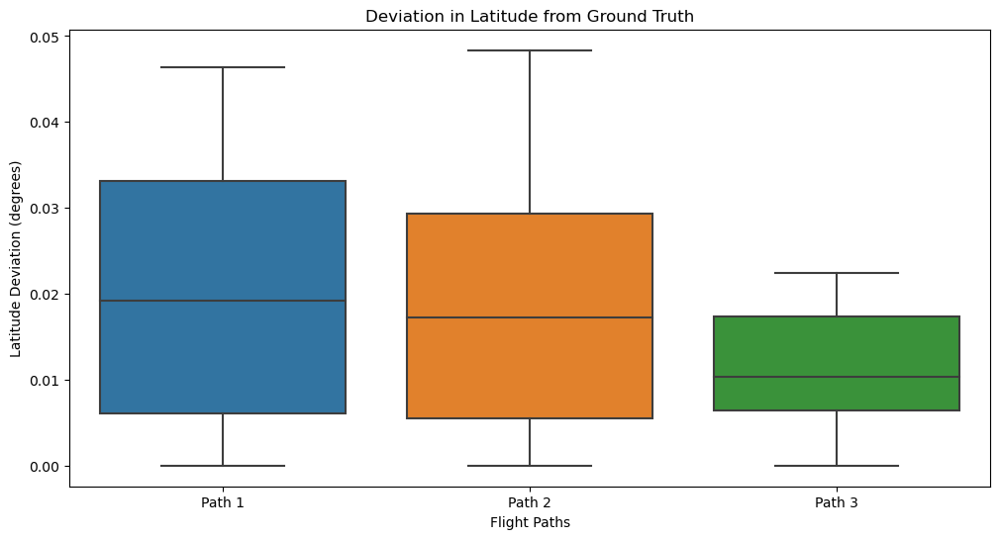

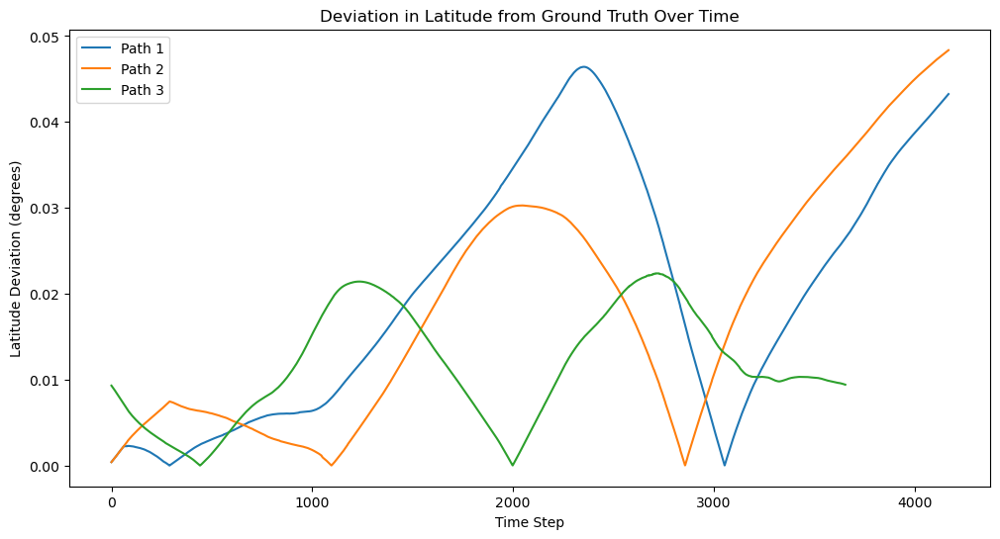

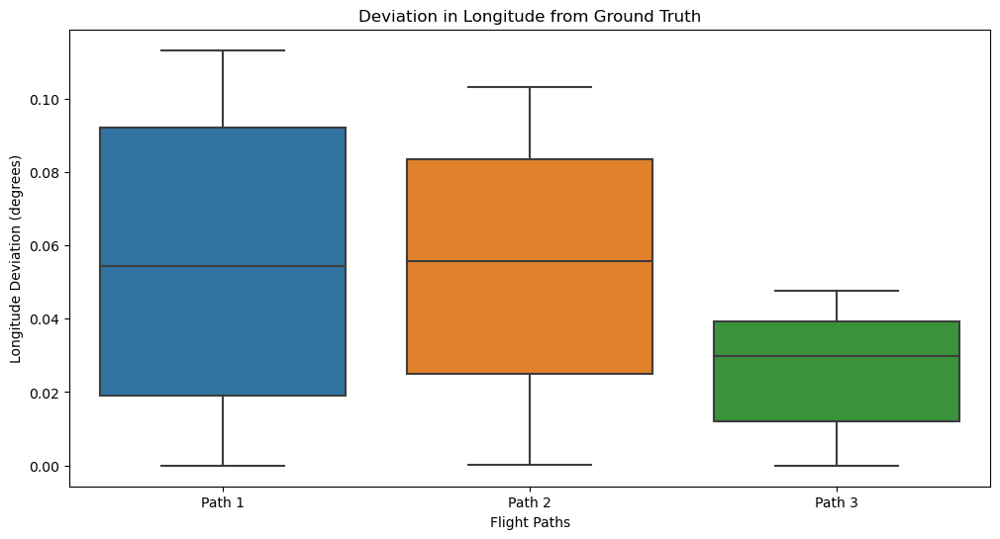

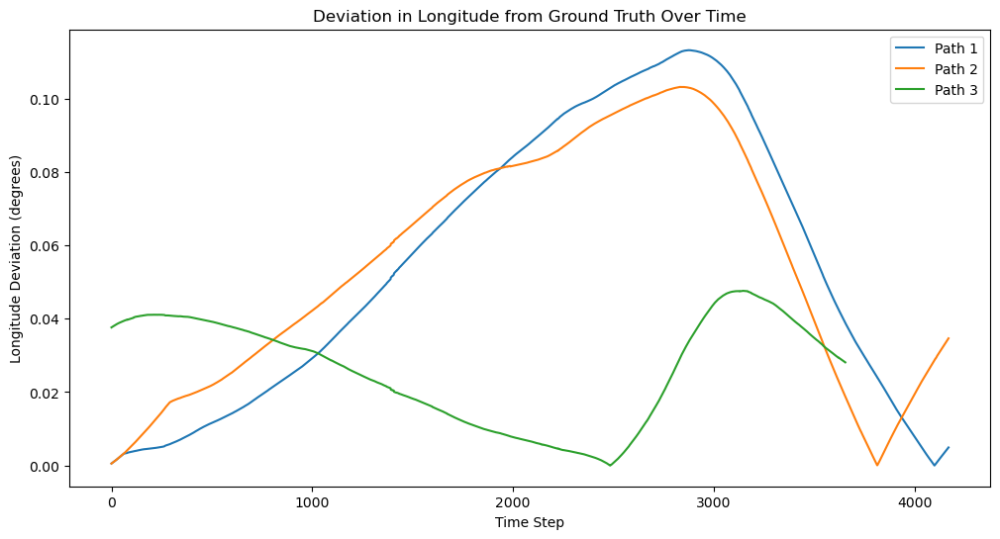

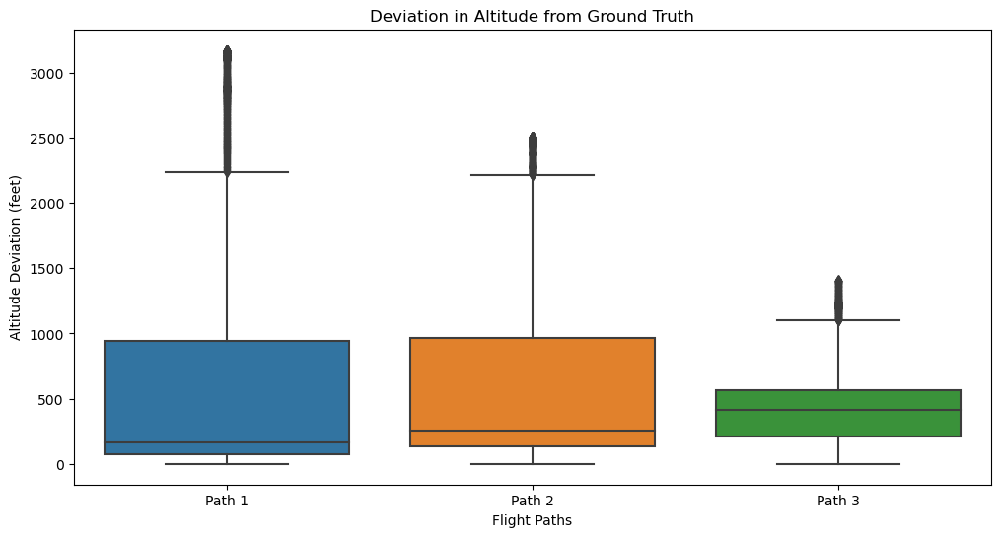

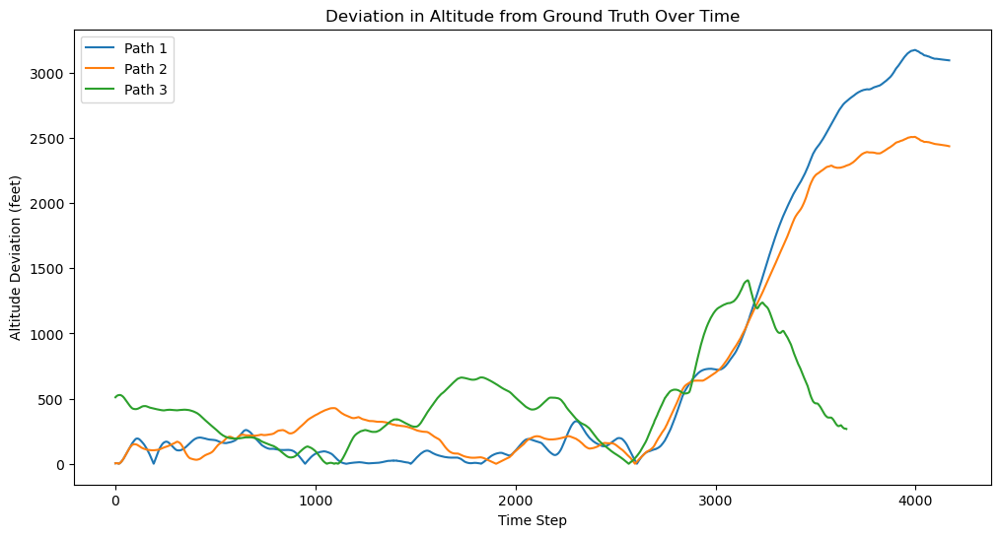

In [67]:

# Compute deviations
lat_deviations, long_deviations, alt_deviations = compute_deviations(flight_paths, ground_truth)

# Create DataFrames for plotting
lat_deviations_df = pd.DataFrame(lat_deviations).transpose()
lat_deviations_df.columns = [f'Path {i+1}' for i in range(len(lat_deviations))]

long_deviations_df = pd.DataFrame(long_deviations).transpose()
long_deviations_df.columns = [f'Path {i+1}' for i in range(len(long_deviations))]

alt_deviations_df = pd.DataFrame(alt_deviations).transpose()
alt_deviations_df.columns = [f'Path {i+1}' for i in range(len(alt_deviations))]

# Plot the deviations
def plot_deviations(deviations_df, title, ylabel):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=deviations_df)
    plt.title(title)
    plt.xlabel('Flight Paths')
    plt.ylabel(ylabel)
    plt.show()

    plt.figure(figsize=(12, 6))
    for i in range(deviations_df.shape[1]):
        plt.plot(deviations_df.index, deviations_df.iloc[:, i], label=f'Path {i+1}')
    plt.title(title + ' Over Time')
    plt.xlabel('Time Step')
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot latitude deviations
plot_deviations(lat_deviations_df, 'Deviation in Latitude from Ground Truth', 'Latitude Deviation (degrees)')

# Plot longitude deviations
plot_deviations(long_deviations_df, 'Deviation in Longitude from Ground Truth', 'Longitude Deviation (degrees)')

# Plot altitude deviations
plot_deviations(alt_deviations_df, 'Deviation in Altitude from Ground Truth', 'Altitude Deviation (feet)')

In [68]:

# Create a map centered around the average coordinates
avg_lat = sum([coord[0] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
avg_long = sum([coord[1] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
m = folium.Map(location=[avg_lat, avg_long], zoom_start=10)

# Plot the ground truth path
ground_truth_coords = [(lat, long) for lat, long, alt in ground_truth]
folium.PolyLine(ground_truth_coords, color='blue', weight=5, opacity=0.6, tooltip='Ground Truth Path').add_to(m)

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_coords = [(lat, long) for lat, long, alt in path]
    folium.PolyLine(flight_coords, color=colors[i % len(colors)], weight=2, opacity=0.6, tooltip=f'Flight Path {i+1}').add_to(m)

# Save the map to an HTML file
map_output_path = 'flight_paths_map.html'
m.save(map_output_path)
print(f"Map saved to {map_output_path}")

Map saved to flight_paths_map.html


In [69]:

# Create a 3D plot
fig = go.Figure()

# Plot the ground truth path
ground_truth_lat = [coord[0] for coord in ground_truth]
ground_truth_long = [coord[1] for coord in ground_truth]
ground_truth_alt = [coord[2] for coord in ground_truth]
fig.add_trace(go.Scatter3d(
    x=ground_truth_long,
    y=ground_truth_lat,
    z=ground_truth_alt,
    mode='lines',
    name='Ground Truth Path',
    line=dict(color='blue', width=5)
))

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_lat = [coord[0] for coord in path]
    flight_long = [coord[1] for coord in path]
    flight_alt = [coord[2] for coord in path]
    fig.add_trace(go.Scatter3d(
        x=flight_long,
        y=flight_lat,
        z=flight_alt,
        mode='lines',
        name=f'Flight Path {i+1}',
        line=dict(color=colors[i % len(colors)], width=2)
    ))

# Set plot titles and labels
fig.update_layout(
    title='3D Flight Paths',
    scene=dict(
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.2),  # Adjust the z aspect ratio to flatten the plot
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Altitude'
    )
        
    
)

# Show the plot
fig.show()

### BUOCHS no AR

In [62]:

# Folder containing the CSV files
folder_path = './BUOCHS/'
ground_truth_path = './BUOCHS/03_BuochsExport 2024-07-02-12-13.csv' #./USERSTUDY/TASKS_StartingPoints/XXX.csv

# Read the CSV files
data_frames = read_csv_files(folder_path)

# Extract the coordinates from the files
flight_paths = extract_coordinates(data_frames)

# Read the ground truth path
ground_truth = read_ground_truth(ground_truth_path)


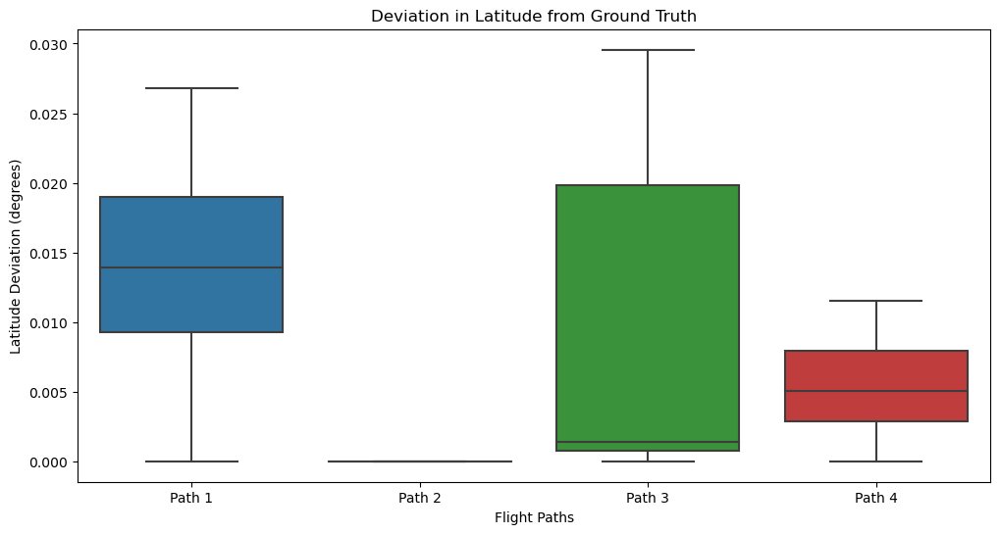

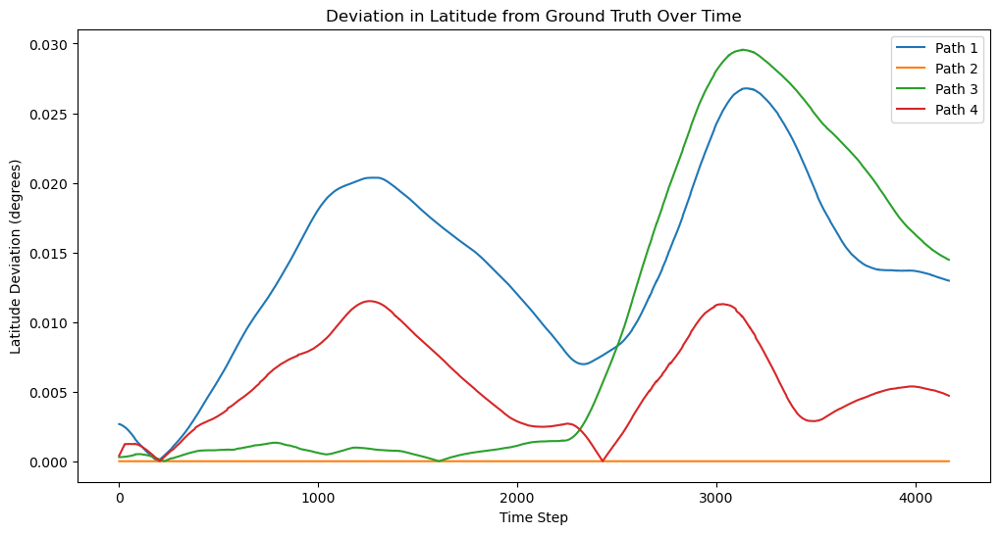

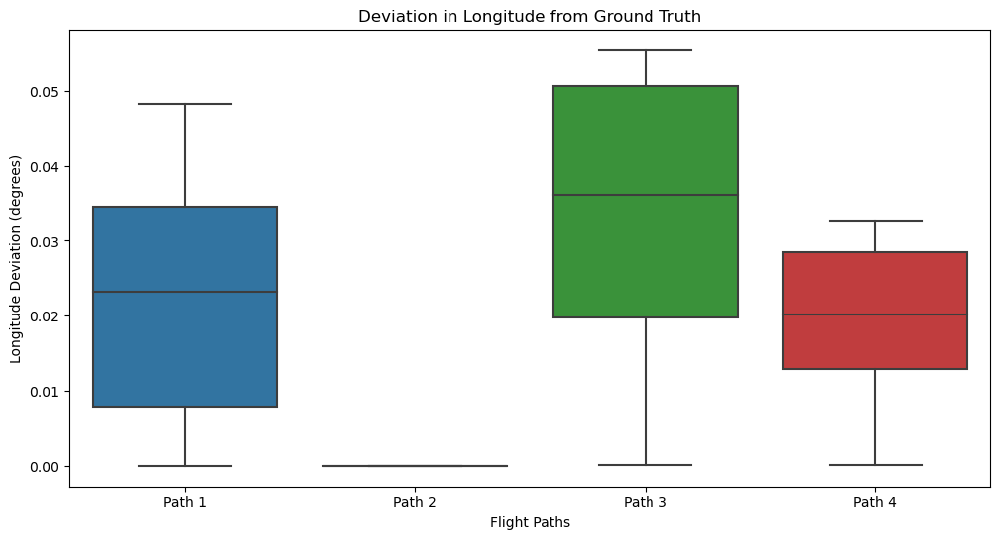

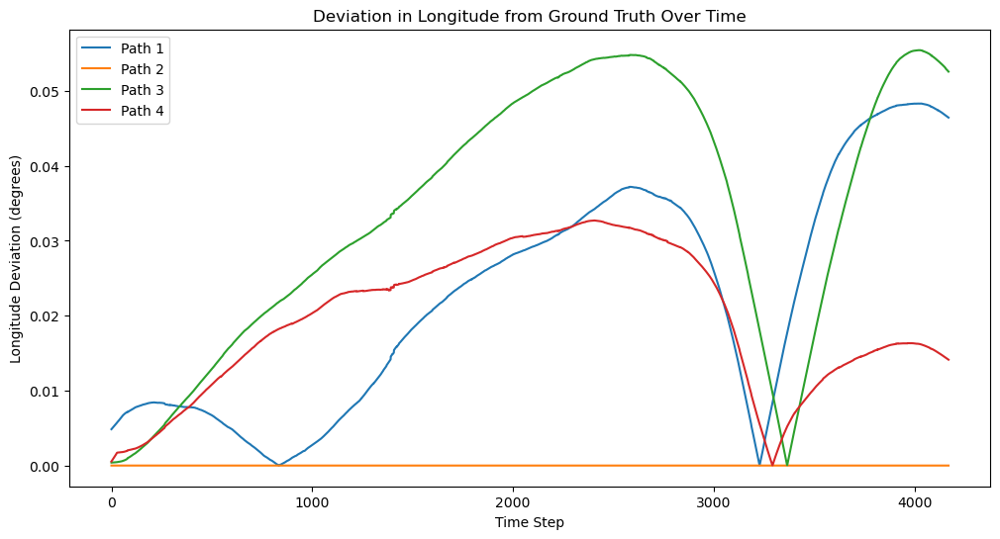

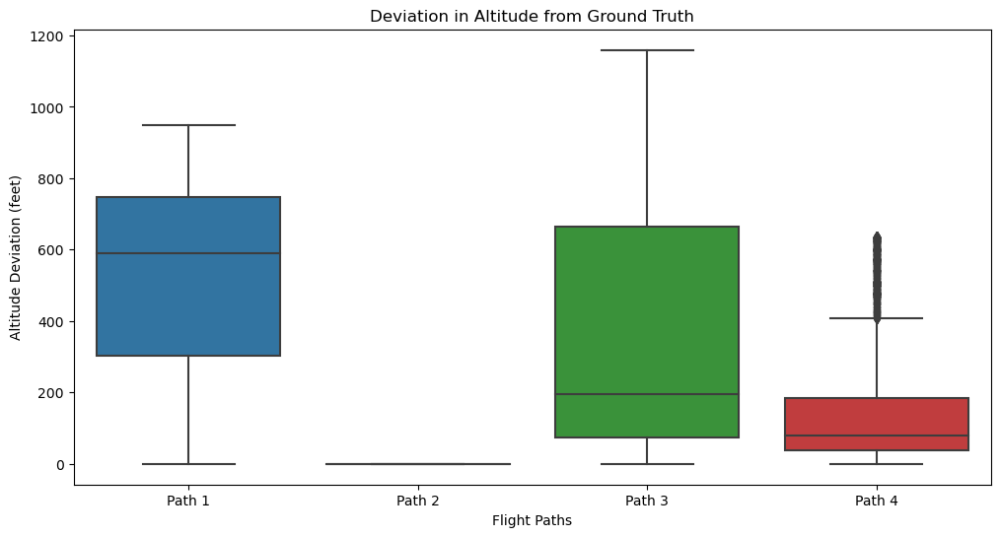

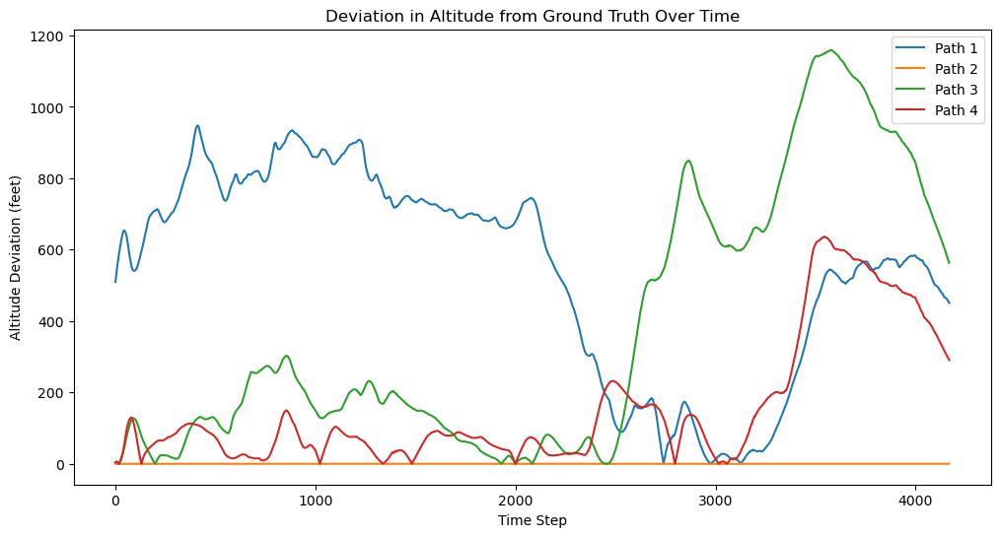

In [63]:

# Compute deviations
lat_deviations, long_deviations, alt_deviations = compute_deviations(flight_paths, ground_truth)

# Create DataFrames for plotting
lat_deviations_df = pd.DataFrame(lat_deviations).transpose()
lat_deviations_df.columns = [f'Path {i+1}' for i in range(len(lat_deviations))]

long_deviations_df = pd.DataFrame(long_deviations).transpose()
long_deviations_df.columns = [f'Path {i+1}' for i in range(len(long_deviations))]

alt_deviations_df = pd.DataFrame(alt_deviations).transpose()
alt_deviations_df.columns = [f'Path {i+1}' for i in range(len(alt_deviations))]

# Plot the deviations
def plot_deviations(deviations_df, title, ylabel):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=deviations_df)
    plt.title(title)
    plt.xlabel('Flight Paths')
    plt.ylabel(ylabel)
    plt.show()

    plt.figure(figsize=(12, 6))
    for i in range(deviations_df.shape[1]):
        plt.plot(deviations_df.index, deviations_df.iloc[:, i], label=f'Path {i+1}')
    plt.title(title + ' Over Time')
    plt.xlabel('Time Step')
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot latitude deviations
plot_deviations(lat_deviations_df, 'Deviation in Latitude from Ground Truth', 'Latitude Deviation (degrees)')

# Plot longitude deviations
plot_deviations(long_deviations_df, 'Deviation in Longitude from Ground Truth', 'Longitude Deviation (degrees)')

# Plot altitude deviations
plot_deviations(alt_deviations_df, 'Deviation in Altitude from Ground Truth', 'Altitude Deviation (feet)')

In [64]:

# Create a map centered around the average coordinates
avg_lat = sum([coord[0] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
avg_long = sum([coord[1] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
m = folium.Map(location=[avg_lat, avg_long], zoom_start=10)

# Plot the ground truth path
ground_truth_coords = [(lat, long) for lat, long, alt in ground_truth]
folium.PolyLine(ground_truth_coords, color='blue', weight=5, opacity=0.6, tooltip='Ground Truth Path').add_to(m)

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_coords = [(lat, long) for lat, long, alt in path]
    folium.PolyLine(flight_coords, color=colors[i % len(colors)], weight=2, opacity=0.6, tooltip=f'Flight Path {i+1}').add_to(m)

# Save the map to an HTML file
map_output_path = 'flight_paths_map.html'
m.save(map_output_path)
print(f"Map saved to {map_output_path}")

Map saved to flight_paths_map.html


In [65]:

# Create a 3D plot
fig = go.Figure()

# Plot the ground truth path
ground_truth_lat = [coord[0] for coord in ground_truth]
ground_truth_long = [coord[1] for coord in ground_truth]
ground_truth_alt = [coord[2] for coord in ground_truth]
fig.add_trace(go.Scatter3d(
    x=ground_truth_long,
    y=ground_truth_lat,
    z=ground_truth_alt,
    mode='lines',
    name='Ground Truth Path',
    line=dict(color='blue', width=5)
))

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_lat = [coord[0] for coord in path]
    flight_long = [coord[1] for coord in path]
    flight_alt = [coord[2] for coord in path]
    fig.add_trace(go.Scatter3d(
        x=flight_long,
        y=flight_lat,
        z=flight_alt,
        mode='lines',
        name=f'Flight Path {i+1}',
        line=dict(color=colors[i % len(colors)], width=2)
    ))

# Set plot titles and labels
fig.update_layout(
    title='3D Flight Paths',
    scene=dict(
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.2),  # Adjust the z aspect ratio to flatten the plot
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Altitude'
    )
        
    
)

# Show the plot
fig.show()

### Grenchen with AR

In [55]:

# Folder containing the CSV files
folder_path = './GRENCHEN_AR/'
ground_truth_path = './GRENCHEN_AR/07_GrenchAR2024-07-09-16-29.csv' #./USERSTUDY/TASKS_StartingPoints/XXX.csv

# Read the CSV files
data_frames = read_csv_files(folder_path)

# Extract the coordinates from the files
flight_paths = extract_coordinates(data_frames)

# Read the ground truth path
ground_truth = read_ground_truth(ground_truth_path)


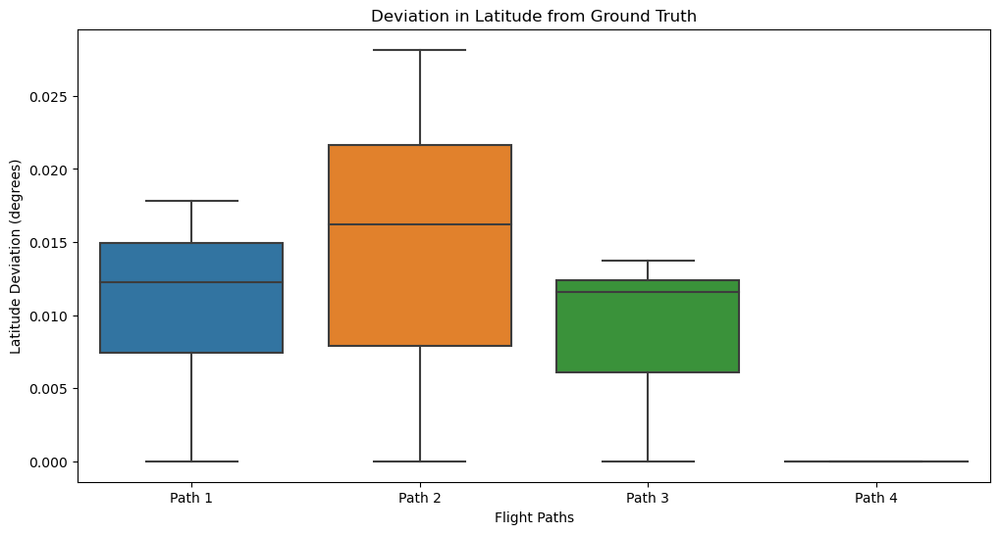

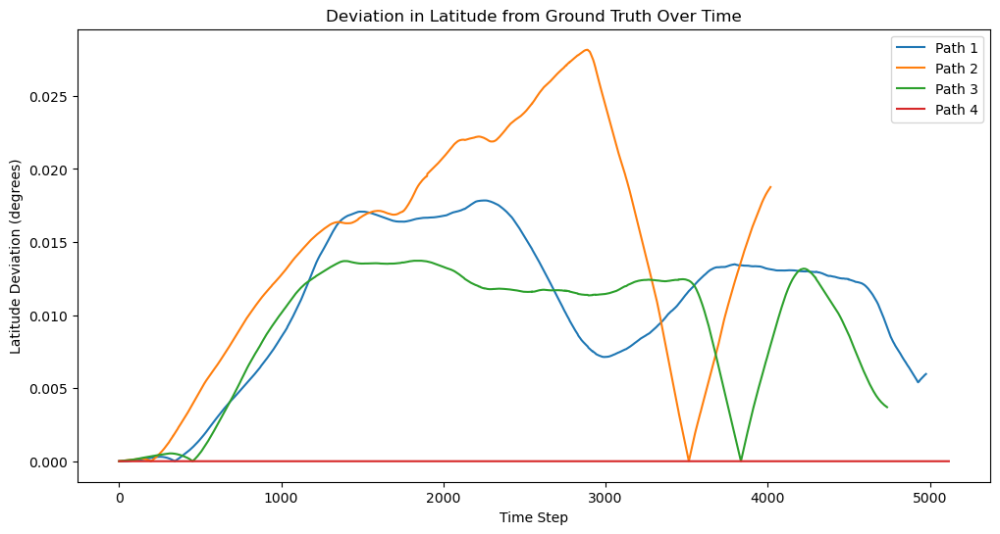

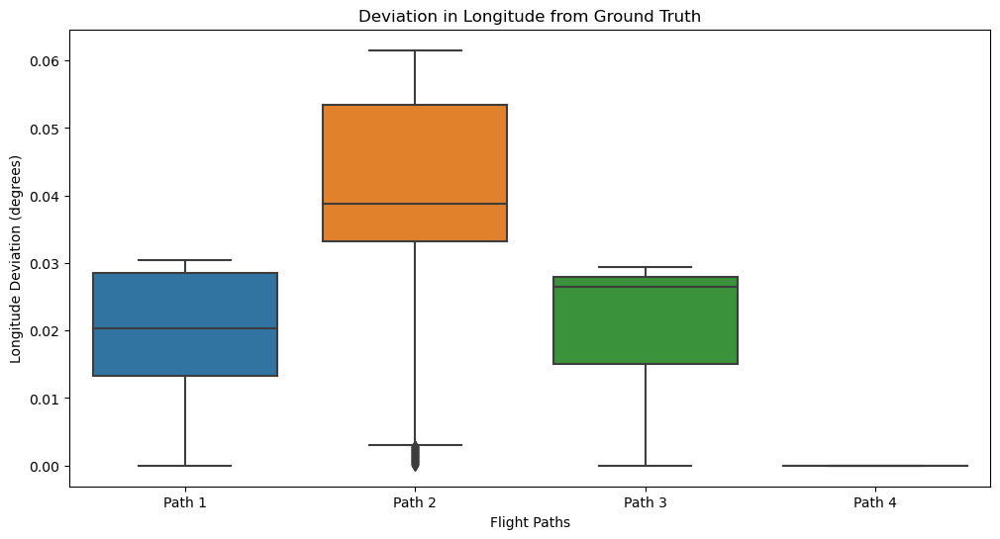

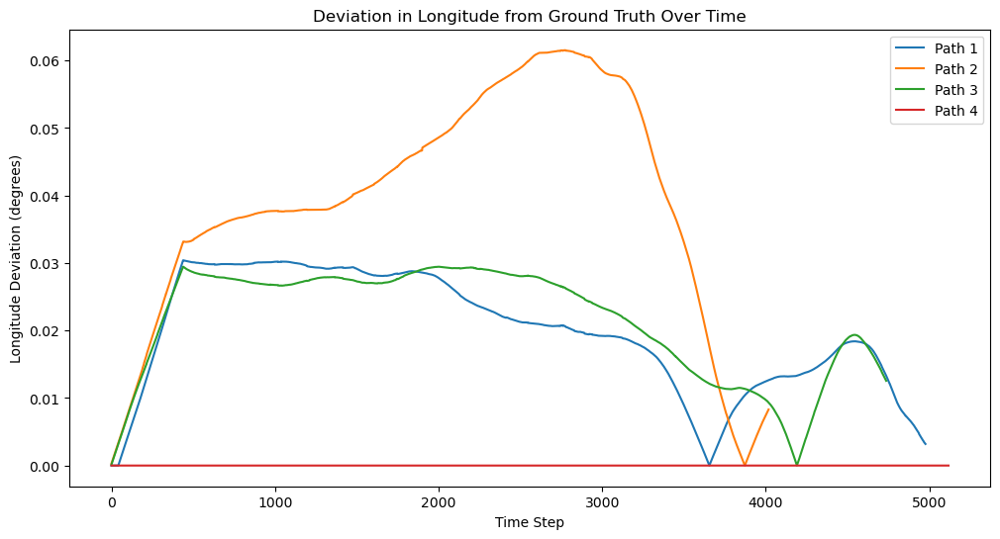

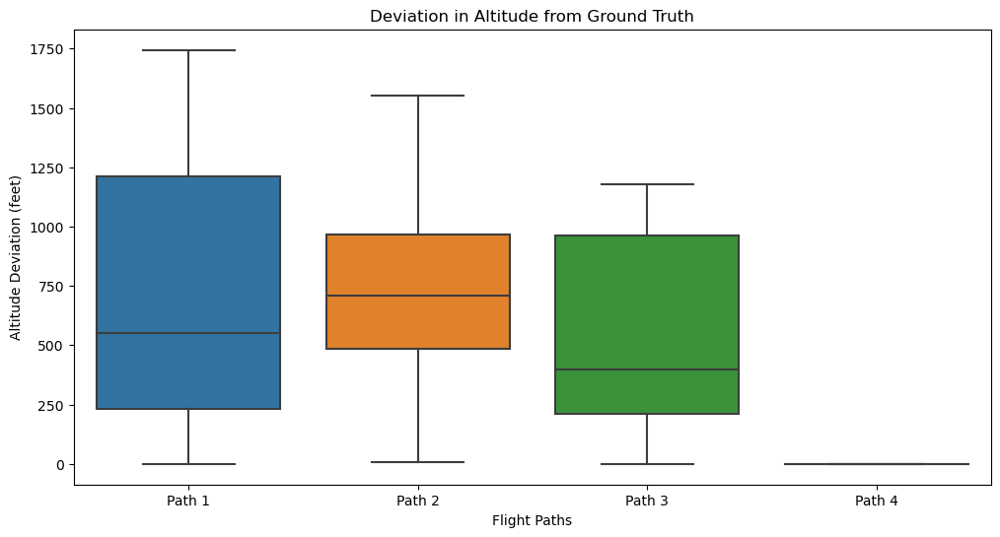

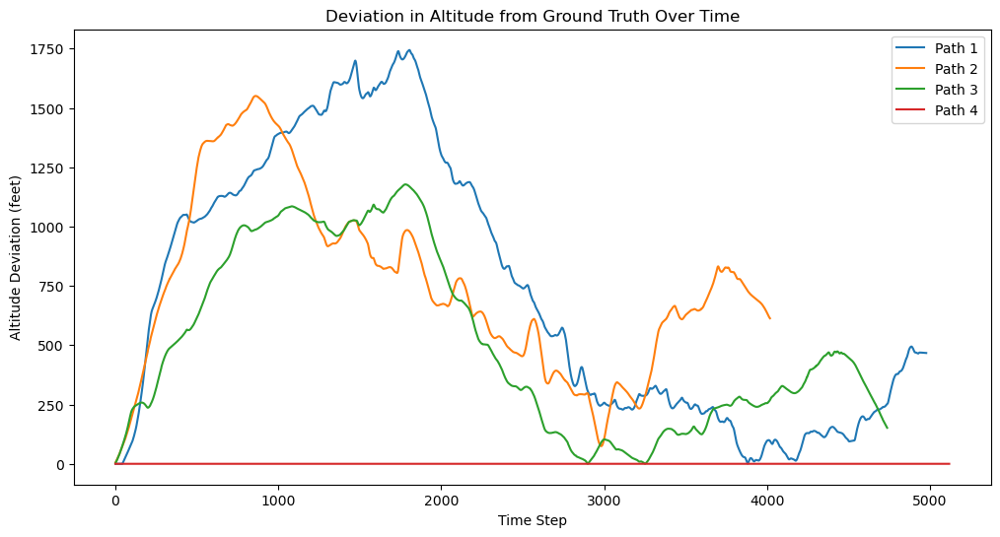

In [56]:

# Compute deviations
lat_deviations, long_deviations, alt_deviations = compute_deviations(flight_paths, ground_truth)

# Create DataFrames for plotting
lat_deviations_df = pd.DataFrame(lat_deviations).transpose()
lat_deviations_df.columns = [f'Path {i+1}' for i in range(len(lat_deviations))]

long_deviations_df = pd.DataFrame(long_deviations).transpose()
long_deviations_df.columns = [f'Path {i+1}' for i in range(len(long_deviations))]

alt_deviations_df = pd.DataFrame(alt_deviations).transpose()
alt_deviations_df.columns = [f'Path {i+1}' for i in range(len(alt_deviations))]

# Plot the deviations
def plot_deviations(deviations_df, title, ylabel):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=deviations_df)
    plt.title(title)
    plt.xlabel('Flight Paths')
    plt.ylabel(ylabel)
    plt.show()

    plt.figure(figsize=(12, 6))
    for i in range(deviations_df.shape[1]):
        plt.plot(deviations_df.index, deviations_df.iloc[:, i], label=f'Path {i+1}')
    plt.title(title + ' Over Time')
    plt.xlabel('Time Step')
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot latitude deviations
plot_deviations(lat_deviations_df, 'Deviation in Latitude from Ground Truth', 'Latitude Deviation (degrees)')

# Plot longitude deviations
plot_deviations(long_deviations_df, 'Deviation in Longitude from Ground Truth', 'Longitude Deviation (degrees)')

# Plot altitude deviations
plot_deviations(alt_deviations_df, 'Deviation in Altitude from Ground Truth', 'Altitude Deviation (feet)')

In [57]:

# Create a map centered around the average coordinates
avg_lat = sum([coord[0] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
avg_long = sum([coord[1] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
m = folium.Map(location=[avg_lat, avg_long], zoom_start=10)

# Plot the ground truth path
ground_truth_coords = [(lat, long) for lat, long, alt in ground_truth]
folium.PolyLine(ground_truth_coords, color='blue', weight=5, opacity=0.6, tooltip='Ground Truth Path').add_to(m)

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_coords = [(lat, long) for lat, long, alt in path]
    folium.PolyLine(flight_coords, color=colors[i % len(colors)], weight=2, opacity=0.6, tooltip=f'Flight Path {i+1}').add_to(m)

# Save the map to an HTML file
map_output_path = 'flight_paths_map.html'
m.save(map_output_path)
print(f"Map saved to {map_output_path}")

Map saved to flight_paths_map.html


In [58]:

# Create a 3D plot
fig = go.Figure()

# Plot the ground truth path
ground_truth_lat = [coord[0] for coord in ground_truth]
ground_truth_long = [coord[1] for coord in ground_truth]
ground_truth_alt = [coord[2] for coord in ground_truth]
fig.add_trace(go.Scatter3d(
    x=ground_truth_long,
    y=ground_truth_lat,
    z=ground_truth_alt,
    mode='lines',
    name='Ground Truth Path',
    line=dict(color='blue', width=5)
))

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_lat = [coord[0] for coord in path]
    flight_long = [coord[1] for coord in path]
    flight_alt = [coord[2] for coord in path]
    fig.add_trace(go.Scatter3d(
        x=flight_long,
        y=flight_lat,
        z=flight_alt,
        mode='lines',
        name=f'Flight Path {i+1}',
        line=dict(color=colors[i % len(colors)], width=2)
    ))

# Set plot titles and labels
fig.update_layout(
    title='3D Flight Paths',
    scene=dict(
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.2),  # Adjust the z aspect ratio to flatten the plot
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Altitude'
    )
        
    
)

# Show the plot
fig.show()

### Grenchen no AR

In [47]:

# Folder containing the CSV files
folder_path = './GRENCHEN/'
ground_truth_path = './GRENCHEN/04_Grench_2024-07-03-10-43.csv' #./USERSTUDY/TASKS_StartingPoints/XXX.csv

# Read the CSV files
data_frames = read_csv_files(folder_path)

# Extract the coordinates from the files
flight_paths = extract_coordinates(data_frames)

# Read the ground truth path
ground_truth = read_ground_truth(ground_truth_path)


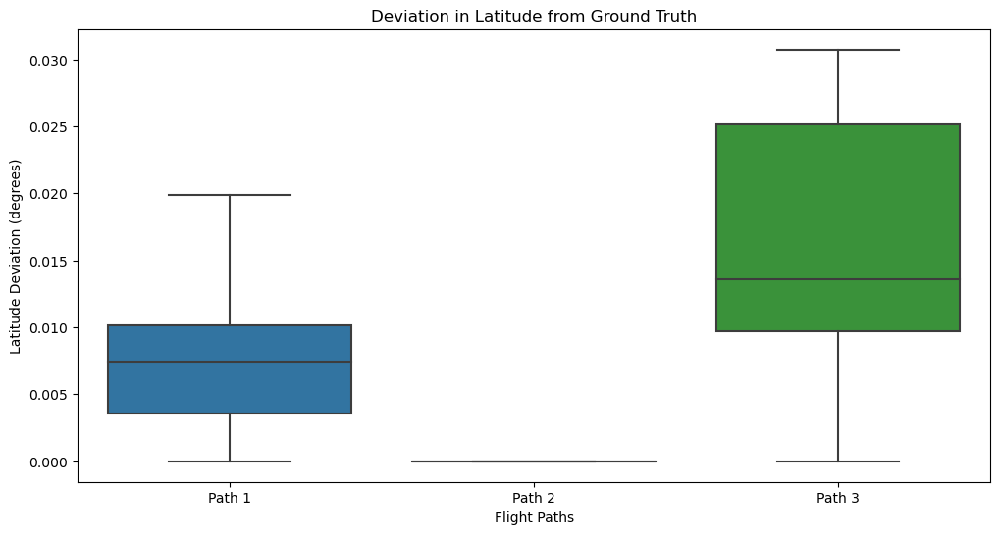

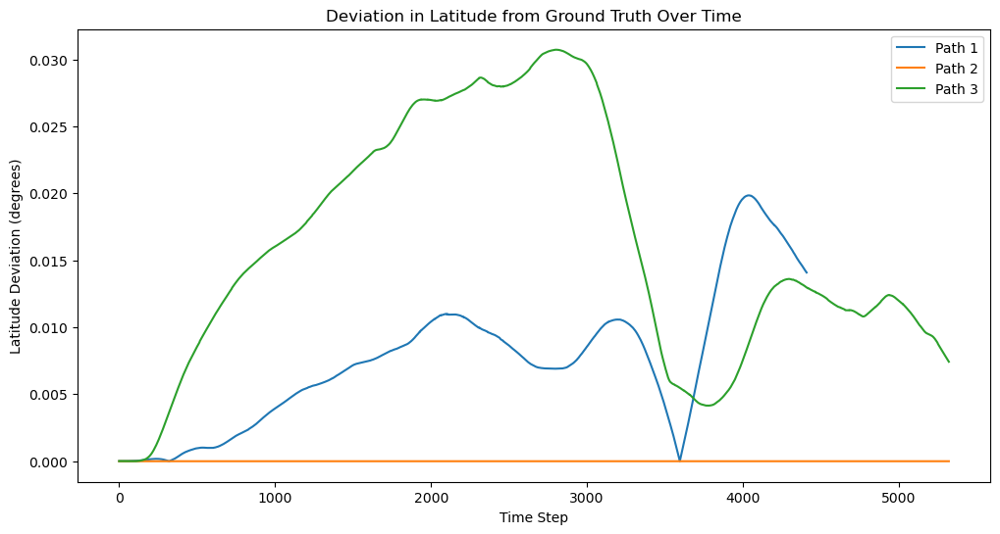

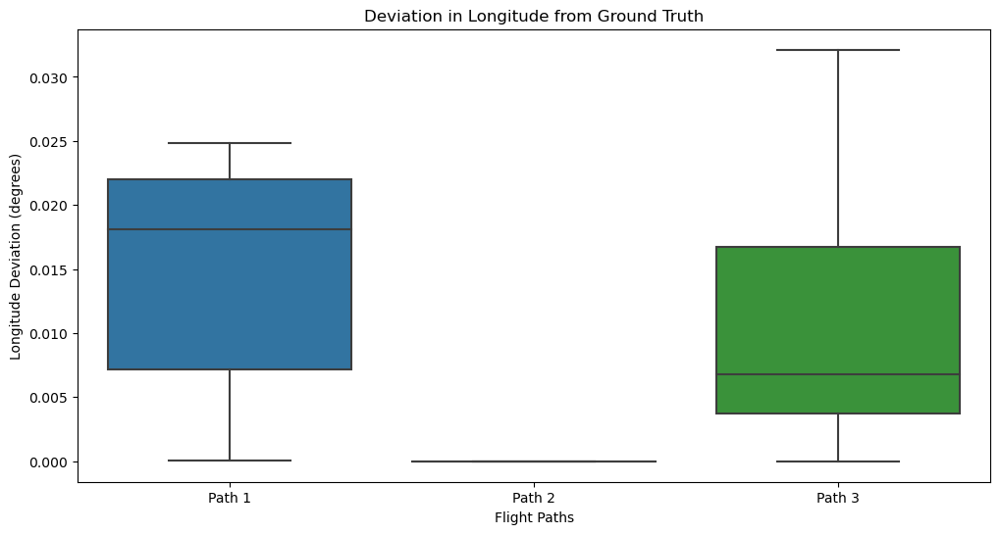

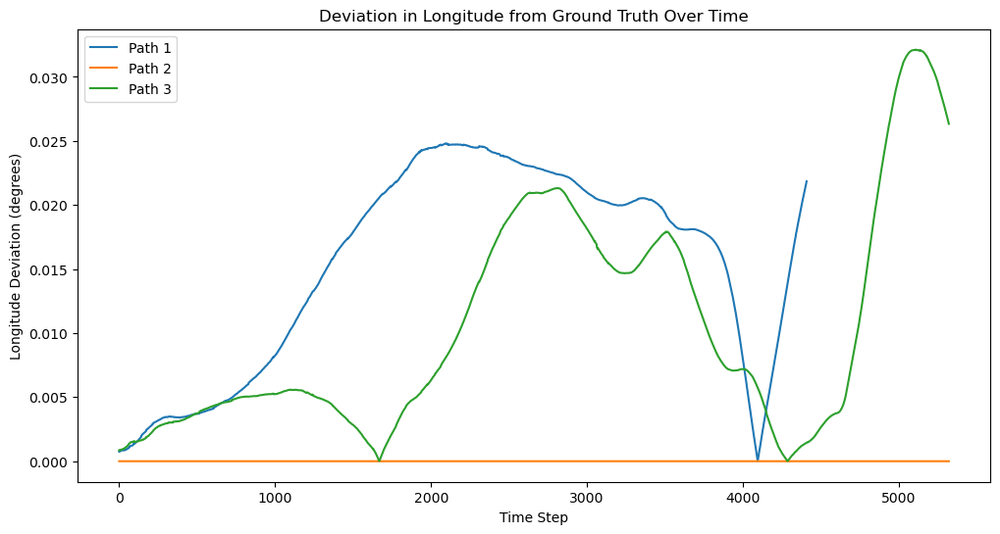

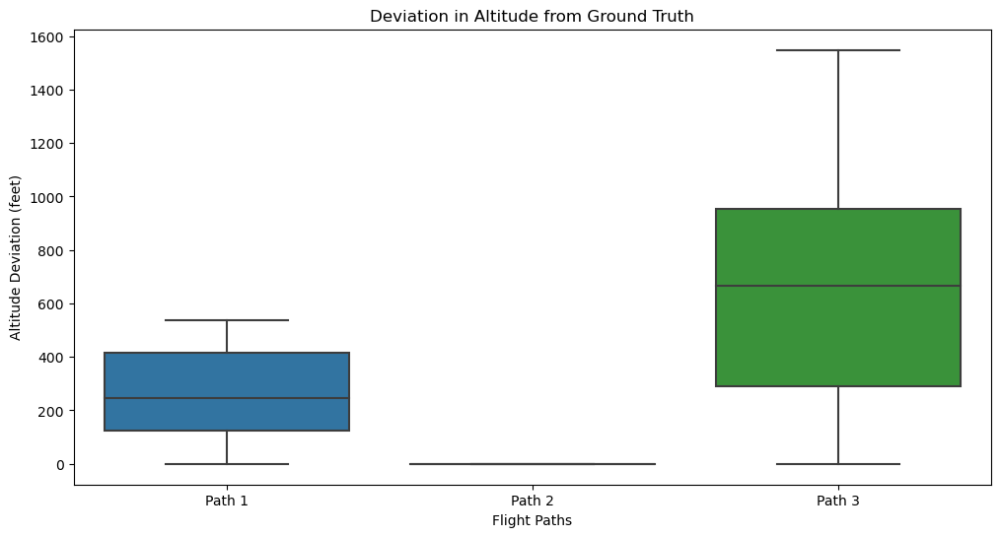

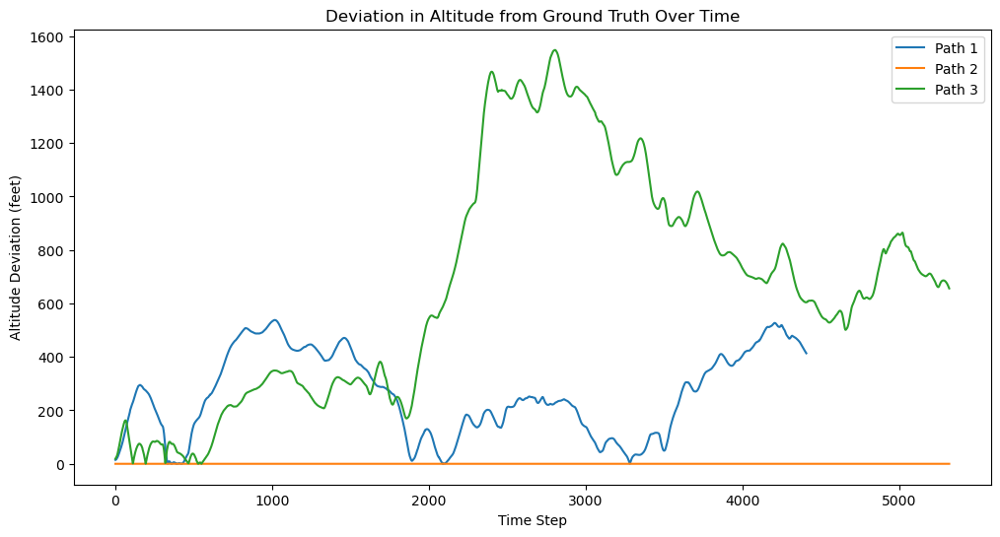

In [48]:

# Compute deviations
lat_deviations, long_deviations, alt_deviations = compute_deviations(flight_paths, ground_truth)

# Create DataFrames for plotting
lat_deviations_df = pd.DataFrame(lat_deviations).transpose()
lat_deviations_df.columns = [f'Path {i+1}' for i in range(len(lat_deviations))]

long_deviations_df = pd.DataFrame(long_deviations).transpose()
long_deviations_df.columns = [f'Path {i+1}' for i in range(len(long_deviations))]

alt_deviations_df = pd.DataFrame(alt_deviations).transpose()
alt_deviations_df.columns = [f'Path {i+1}' for i in range(len(alt_deviations))]

# Plot the deviations
def plot_deviations(deviations_df, title, ylabel):
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=deviations_df)
    plt.title(title)
    plt.xlabel('Flight Paths')
    plt.ylabel(ylabel)
    plt.show()

    plt.figure(figsize=(12, 6))
    for i in range(deviations_df.shape[1]):
        plt.plot(deviations_df.index, deviations_df.iloc[:, i], label=f'Path {i+1}')
    plt.title(title + ' Over Time')
    plt.xlabel('Time Step')
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

# Plot latitude deviations
plot_deviations(lat_deviations_df, 'Deviation in Latitude from Ground Truth', 'Latitude Deviation (degrees)')

# Plot longitude deviations
plot_deviations(long_deviations_df, 'Deviation in Longitude from Ground Truth', 'Longitude Deviation (degrees)')

# Plot altitude deviations
plot_deviations(alt_deviations_df, 'Deviation in Altitude from Ground Truth', 'Altitude Deviation (feet)')

In [49]:

# Create a map centered around the average coordinates
avg_lat = sum([coord[0] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
avg_long = sum([coord[1] for path in flight_paths for coord in path]) / sum([len(path) for path in flight_paths])
m = folium.Map(location=[avg_lat, avg_long], zoom_start=10)

# Plot the ground truth path
ground_truth_coords = [(lat, long) for lat, long, alt in ground_truth]
folium.PolyLine(ground_truth_coords, color='blue', weight=5, opacity=0.6, tooltip='Ground Truth Path').add_to(m)

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_coords = [(lat, long) for lat, long, alt in path]
    folium.PolyLine(flight_coords, color=colors[i % len(colors)], weight=2, opacity=0.6, tooltip=f'Flight Path {i+1}').add_to(m)

# Save the map to an HTML file
map_output_path = 'flight_paths_map.html'
m.save(map_output_path)
print(f"Map saved to {map_output_path}")

Map saved to flight_paths_map.html


In [54]:

# Create a 3D plot
fig = go.Figure()

# Plot the ground truth path
ground_truth_lat = [coord[0] for coord in ground_truth]
ground_truth_long = [coord[1] for coord in ground_truth]
ground_truth_alt = [coord[2] for coord in ground_truth]
fig.add_trace(go.Scatter3d(
    x=ground_truth_long,
    y=ground_truth_lat,
    z=ground_truth_alt,
    mode='lines',
    name='Ground Truth Path',
    line=dict(color='blue', width=5)
))

# Plot each flight path
colors = ['red', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
for i, path in enumerate(flight_paths):
    flight_lat = [coord[0] for coord in path]
    flight_long = [coord[1] for coord in path]
    flight_alt = [coord[2] for coord in path]
    fig.add_trace(go.Scatter3d(
        x=flight_long,
        y=flight_lat,
        z=flight_alt,
        mode='lines',
        name=f'Flight Path {i+1}',
        line=dict(color=colors[i % len(colors)], width=2)
    ))

# Set plot titles and labels
fig.update_layout(
    title='3D Flight Paths',
    scene=dict(
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.2),  # Adjust the z aspect ratio to flatten the plot
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Altitude'
    )
        
    
)

# Show the plot
fig.show()